# Import libraries and dataset

In [72]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from termcolor import colored

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split

# Chi Square
from sklearn.feature_selection import chi2
import scipy.stats as stats

# RandomOverSampler to handle imbalanced data
from imblearn.over_sampling import RandomOverSampler

from sklearn.preprocessing import LabelEncoder, StandardScaler

# Cross Validation
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore

from sklearn.metrics import classification_report
from sklearn import metrics



sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
pd.set_option('display.max_columns',29)

In [31]:
df = pd.read_csv("diabetes.csv")

# Exploratory Data Analysis

In [32]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [33]:
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


In [34]:
print(f"Columns name in the dataset: {colored(df.columns, 'magenta')}")

Columns name in the dataset: Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


In [35]:
print(f"Shape of the dataset: {colored(df.shape, 'magenta')}")

Shape of the dataset: (768, 9)


**Observations:**

There are 9 columns and 768 rows. "Outcome" column is our target feature (Dependent variable). Other columns are independent features.

In [36]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


**Observations:**

There are no null values in our dataset.

# Feature Engineering

##### We have to check whether columns like "BloodPressure" contains zero or not as BloodPressure can't be zero.

In [38]:
for i in df.columns:
    print(i,len(df[df[i] == 0]))

Pregnancies 111
Glucose 5
BloodPressure 35
SkinThickness 227
Insulin 374
BMI 11
DiabetesPedigreeFunction 0
Age 0
Outcome 500


**Observations:**

"Pregnancies" column may contain zeros as it will indicate no pregnancies. But Glucose, skinthickness, blood pressure, BMI, and Insulin can never be zero. So we have to change that all zeros to null values then we fill replace/remove null values.

## Replacing Zeros and Nan values

In [39]:
df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']] = df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']].replace(0,np.nan)
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

**Observations:**

We have successfully replace zeros with Nan in our required columns of dataset. Now we have to replace it using ffill or bfill method.

In [40]:
df = df.fillna(method = 'ffill')
df = df.fillna(method = 'bfill')
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

## Outlier detection

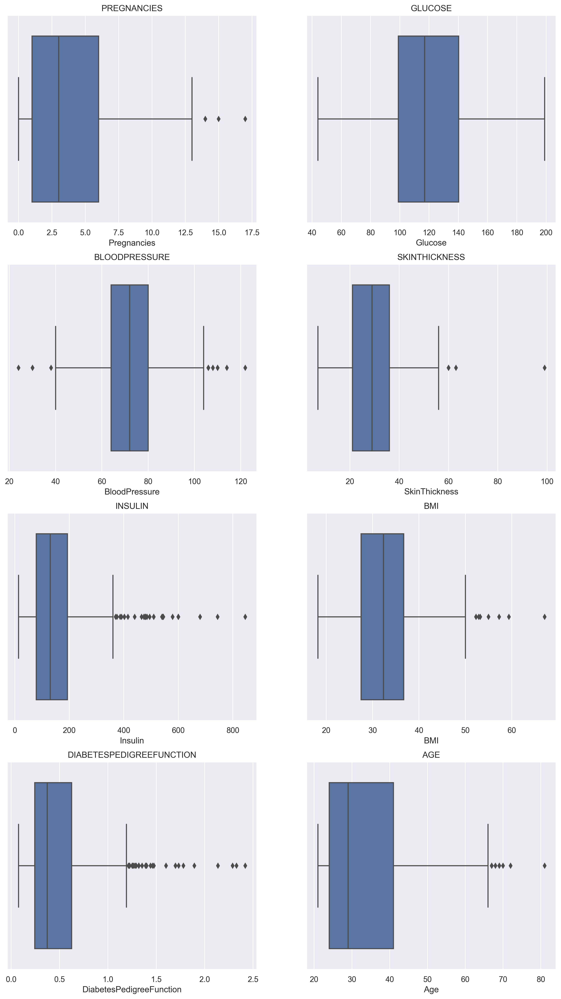

In [41]:
fig1, axes1 =plt.subplots(4,2,figsize=(14, 25))
list1_col= df.columns
for i in range(len(list1_col)-1):
    row=i//2
    col=i%2
    ax=axes1[row,col]
    sns.boxplot(df[list1_col[i]],ax=ax).set(title= list1_col[i].upper())

**Observations:**

Pregnancies can not be of 15 or 16 months hence there was outlier in "Pregnancies" column. Similarly there is outlier in "Insulin", "SkinThickness", "BMI", "DiabetesPedigreeFunction", and "Pregnancies" columns.

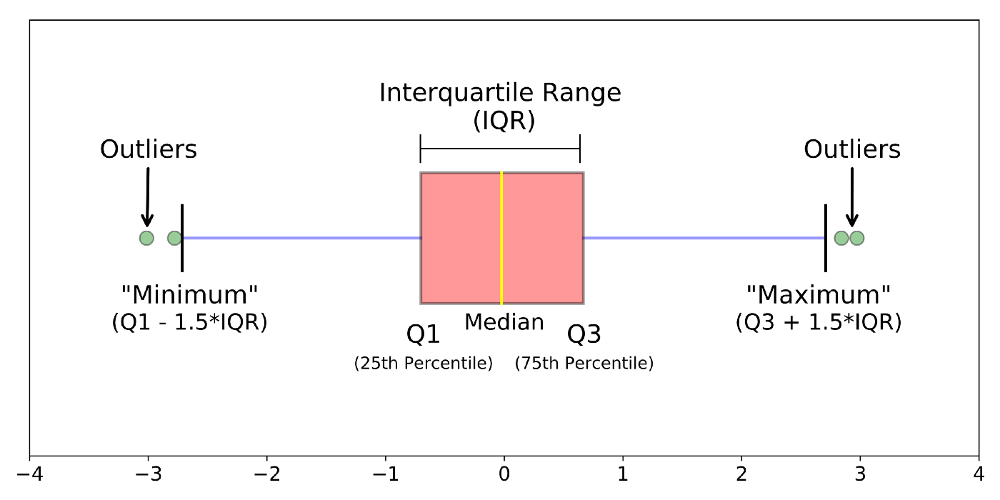
**What is an outlier?**
An outlier is a data point in a data set that is distant from all other observations. A data point that lies outside the overall distribution of the dataset.

**What are the criteria to identify an outlier?**
- Data point that falls outside of 1.5 times of an interquartile range above the 3rd quartile and below the 1st quartile
- Data point that falls outside of 3 standard deviations. we can use a z score and if the z score falls outside of 2 standard deviation

**What is the reason for an outlier to exists in a dataset?**
- Variability in the data
- An experimental measurement error

**What are the impacts of having outliers in a dataset?**
- It causes various problems during our statistical analysis
- It may cause a significant impact on the mean and the standard deviation

**Various ways of finding the outlier**
- Using scatter plots
- Box plot
- Using z score
- Using the IQR interquantile range

In [42]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.514323,72.308594,29.257812,157.084635,32.482031,0.471876,33.240885,0.348958
std,3.369578,30.531191,12.375474,10.544310,114.159085,6.908600,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,21.000000,78.750000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,29.000000,130.000000,32.350000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,36.000000,193.250000,36.725000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [43]:
print(df.Insulin.shape)
print(df.SkinThickness.shape)
print(df.BMI.shape)
print(df.DiabetesPedigreeFunction.shape)
print(df.Pregnancies.shape)

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)


#df = df[~((df.iloc[:,3:7] < (Q1[3:7] - 1.5 * IQR[3:7])) |(df.iloc[:,3:7] > (Q3[3:7] + 1.5 * IQR[3:7]))).any(axis=1)]

df = df[~((df.iloc[:,4:5] < (Q1[4] - 1.5 * IQR[4])) |(df.iloc[:,4:5] > (Q3[4] + 1.5 * IQR[4]))).any(axis=1)] #Insulin
df = df[~((df.iloc[:,3:4] < (Q1[3] - 1.5 * IQR[3])) |(df.iloc[:,3:4] > (Q3[3] + 1.5 * IQR[3]))).any(axis=1)] #SkinThickness
df = df[~((df.iloc[:,5:6] < (Q1[5] - 1.5 * IQR[5])) |(df.iloc[:,5:6] > (Q3[5] + 1.5 * IQR[5]))).any(axis=1)] #BMI
df = df[~((df.iloc[:,6:7] < (Q1[6] - 1.5 * IQR[6])) |(df.iloc[:,6:7] > (Q3[6] + 1.5 * IQR[6]))).any(axis=1)] #DiabetesPedigreeFunction
df = df[~ (df.iloc[:,0:1] > 9).any(axis=1)] #Pregnancies: Considering only till 9 months

print(df.Insulin.shape)
print(df.SkinThickness.shape)
print(df.BMI.shape)
print(df.DiabetesPedigreeFunction.shape)
print(df.Pregnancies.shape)

(768,)
(768,)
(768,)
(768,)
(768,)
Pregnancies                   5.0000
Glucose                      41.2500
BloodPressure                16.0000
SkinThickness                15.0000
Insulin                     114.5000
BMI                           9.2250
DiabetesPedigreeFunction      0.3825
Age                          17.0000
Outcome                       1.0000
dtype: float64
(637,)
(637,)
(637,)
(637,)
(637,)


In [44]:
sorted(df.Pregnancies.unique())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

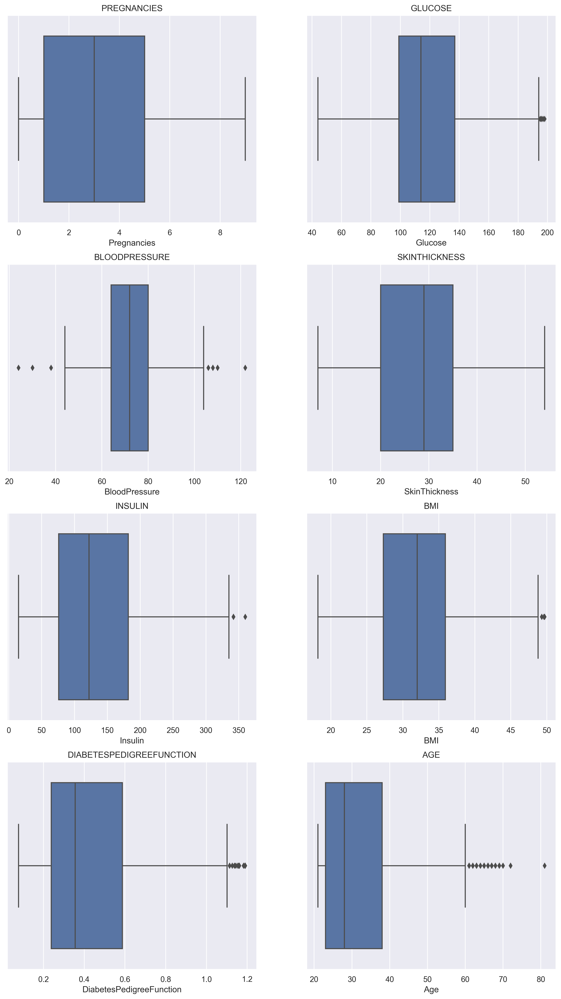

In [45]:
fig1, axes1 =plt.subplots(4,2,figsize=(14, 25))
list1_col= df.columns
for i in range(len(list1_col)-1):
    row=i//2
    col=i%2
    ax=axes1[row,col]
    sns.boxplot(df[list1_col[i]],ax=ax).set(title=list1_col[i].upper())

##### Outlier removed!

# Data visualization

In [46]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,94.0,33.6,0.627,50,1
1,1,85.0,66.0,29.0,94.0,26.6,0.351,31,0
2,8,183.0,64.0,29.0,94.0,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
5,5,116.0,74.0,35.0,168.0,25.6,0.201,30,0


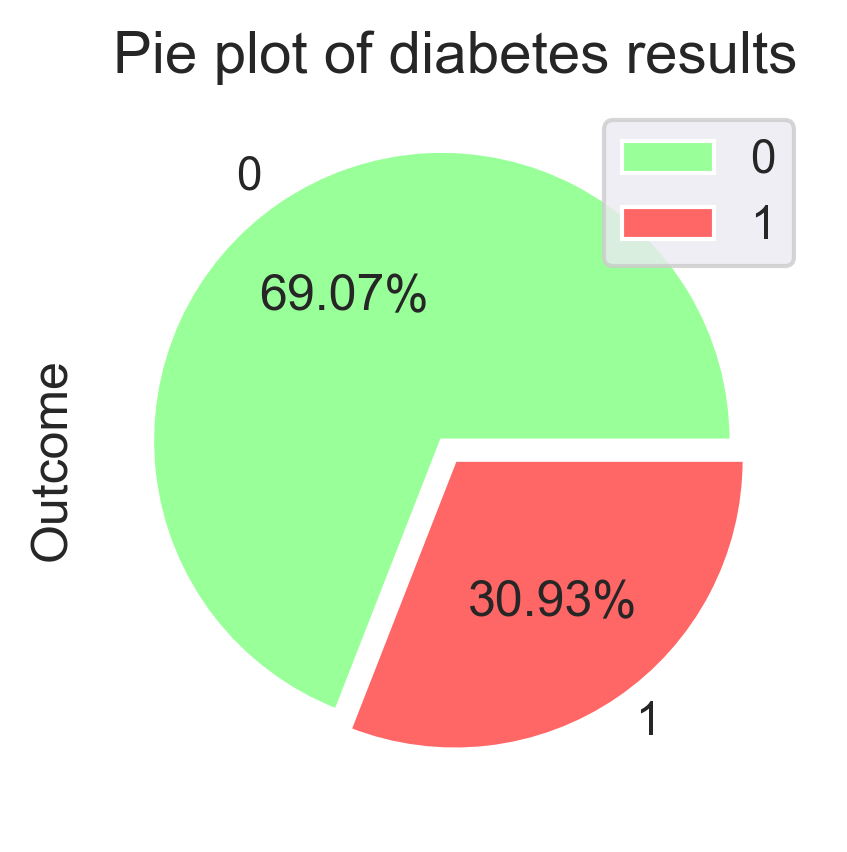

In [47]:
explode=(0.08,0)

df['Outcome'].value_counts().plot.pie(autopct='%1.2f%%',figsize=(3,3),explode=explode,colors=['#99ff99','#ff6666'])
plt.title("Pie plot of diabetes results", fontsize=14)
plt.tight_layout()
plt.legend()
plt.show()

<AxesSubplot:xlabel='Outcome', ylabel='count'>

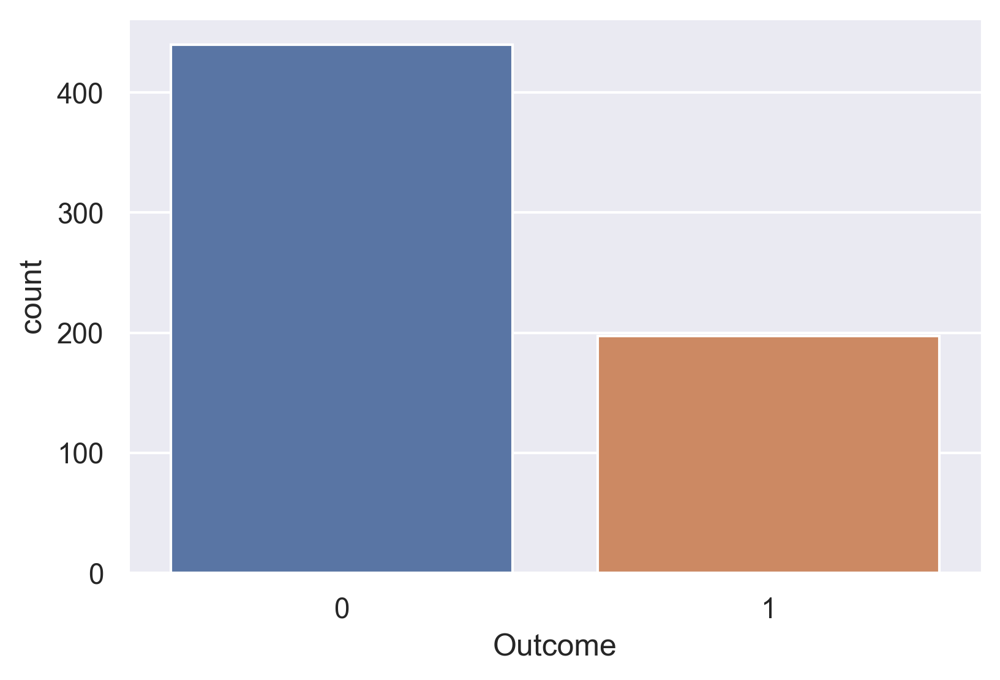

In [48]:
sns.countplot(x = "Outcome", data = df)

In [49]:
df.Outcome.value_counts()

0    440
1    197
Name: Outcome, dtype: int64

**Observations:**

- There are 32.02% (220 peoples) people with diabetes and 67.98% (467 peoples) people who are not diagnosed with diabetes.
- We can say data is imbalanced

<AxesSubplot:xlabel='Pregnancies', ylabel='count'>

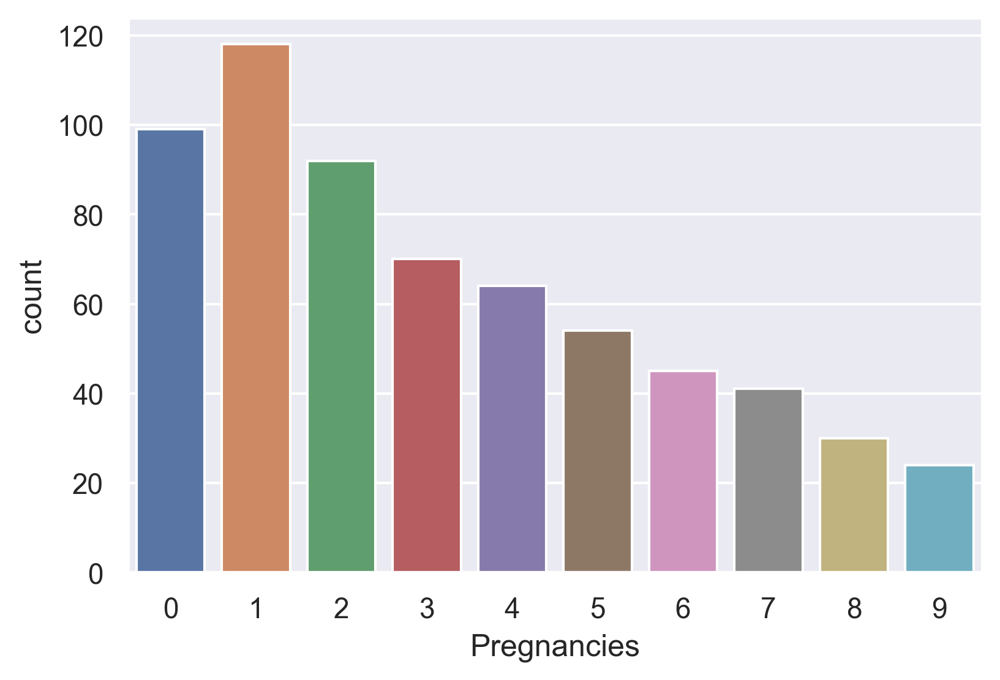

In [50]:
sns.countplot(x = "Pregnancies", data = df)

<AxesSubplot:xlabel='Age', ylabel='count'>

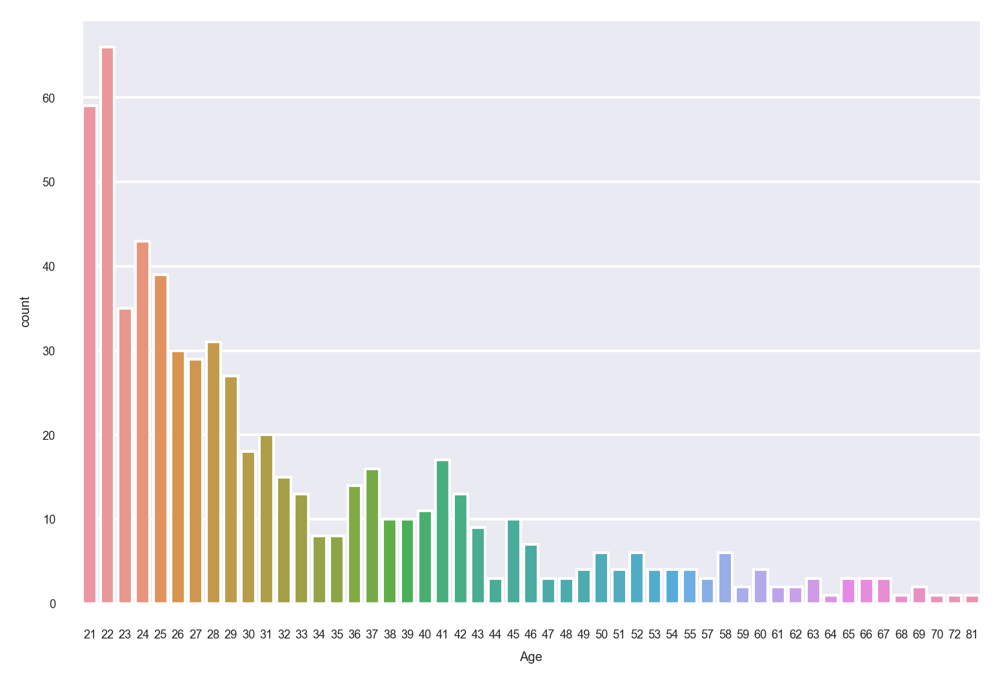

In [51]:
sns.set(font_scale = 0.4)
sns.countplot(x = "Age", data = df)

# Feature Selection

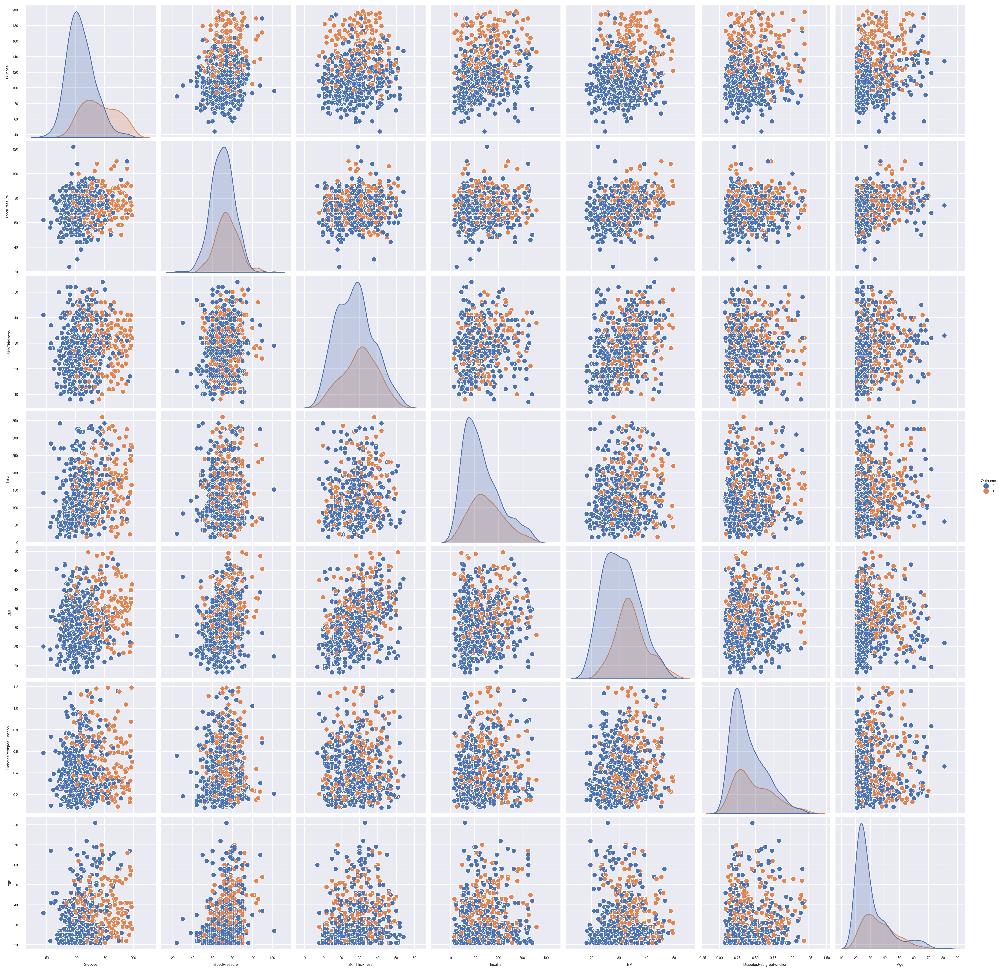

In [52]:
sns.pairplot(df.drop("Pregnancies", axis=1), hue="Outcome", diag_kind="kde")

### Relation among numerical and target feature

In [53]:
df_anova = df.drop("Pregnancies", axis=1)
grps = pd.unique(df_anova.Outcome.values)
grps

for i in range(len(df_anova.columns)-1):
    
    d_data = {grp:df_anova[df_anova.columns[i]][df_anova.Outcome == grp] for grp in grps}

    F, p = stats.f_oneway(d_data[0], d_data[1])
    print("P_Value of {} and Outcome".format(df_anova.columns[i]), p)

    if p < 0.05:
        print("There is relation between {} and Outcome \n".format(df_anova.columns[i]))
    else:
        print("There is no relation between {} and Outcome \n".format(df_anova.columns[i]))

P_Value of Glucose and Outcome 6.257999986516354e-43
There is relation between Glucose and Outcome 

P_Value of BloodPressure and Outcome 1.3619600515570335e-05
There is relation between BloodPressure and Outcome 

P_Value of SkinThickness and Outcome 0.001423642348198696
There is relation between SkinThickness and Outcome 

P_Value of Insulin and Outcome 0.00028669374589219987
There is relation between Insulin and Outcome 

P_Value of BMI and Outcome 9.964348570743606e-13
There is relation between BMI and Outcome 

P_Value of DiabetesPedigreeFunction and Outcome 6.32929852013087e-05
There is relation between DiabetesPedigreeFunction and Outcome 

P_Value of Age and Outcome 2.2692393006322345e-08
There is relation between Age and Outcome 



### Relation among Categorical and target feature

In [54]:
f_p_values = chi2(df[["Pregnancies"]],df["Outcome"])

p_values = pd.Series(f_p_values[1])
p_values.index = ['Pregnancies']
print(p_values.sort_values(ascending=False))

# Null Hypothesis: The null hypothesis states that there is no relationship between the two variables
cnt = 0
for i in p_values:
    if i > 0.05:
        print("There is no relationship", p_values.index[cnt], i)
    else:
        print("There is relationship", p_values.index[cnt], i)
    
    cnt += 1

Pregnancies    7.646051e-16
dtype: float64
There is relationship Pregnancies 7.64605119440014e-16


### Relation among Numerical features

<AxesSubplot:>

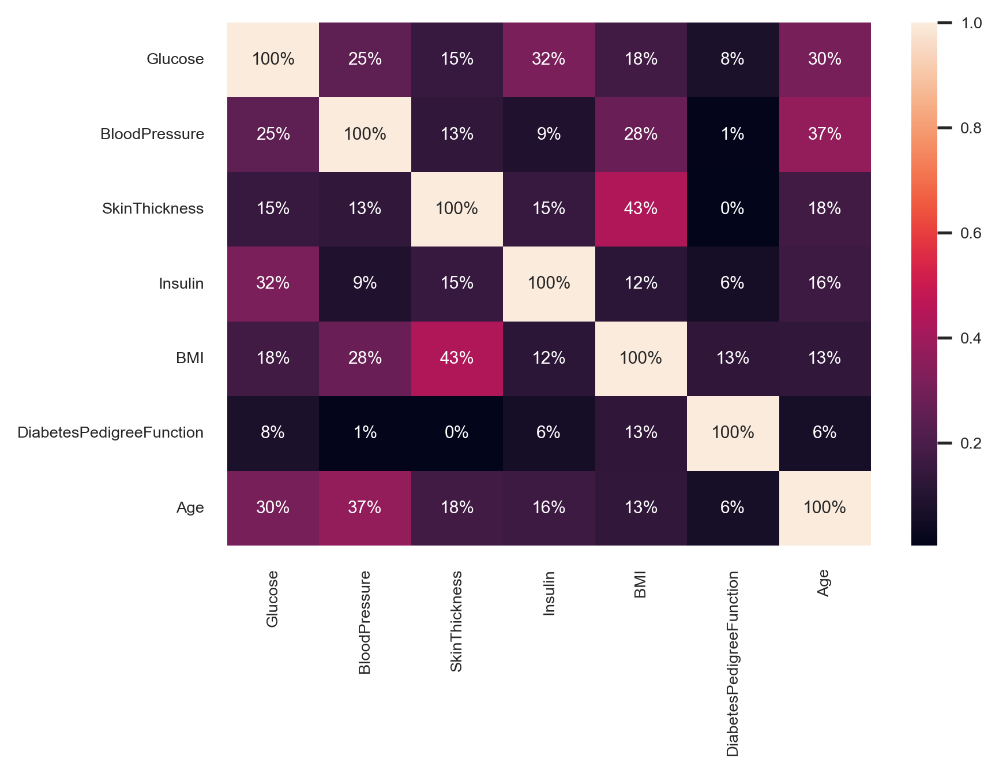

In [55]:
sns.set(font_scale=0.6)
sns.heatmap(df.drop(["Outcome", "Pregnancies"], axis=1).corr("spearman"), annot=True, fmt = '.0%')

In [56]:
# With the following function we can select highly correlated features
# It will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr("spearman")
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

corr_features = correlation(df.drop(["Outcome", "Pregnancies"], axis=1), 0.85)
corr_features

set()

**Observations:**
- There is no need to drop any column because there is no strong correlation among independent feature and all independent feature are correlated with Outcome.

# Seperating Outcome column

Now I am splitting the data into training data and testing data to make a model. Training data will be of 70% while testing data is of 30%.

In [57]:
X = df.drop('Outcome', axis=1)
y = df['Outcome']

# Scaling the data

We are scaling the data here to improve performance of our model and to improve accuracy. This is one of the reason for scaling, another reason is that the Outcome of diabetes can be 1 or 0 while glucose level can be around 150 so it can be seen that outcome is of 1 digit while glucose level is of 3 digits which can decrease performance of our model so I am standardizing the data here.

In [58]:
scaler = StandardScaler()
features = scaler.fit_transform(X)
features

array([[ 1.06035168,  0.96846904,  0.02176117, ...,  0.26706891,
         0.81229326,  1.53583357],
       [-0.8466049 , -1.15603249, -0.47927021, ..., -0.82546345,
        -0.31178604, -0.10507336],
       [ 1.82313431,  2.14874767, -0.64628067, ..., -1.34051442,
         0.99556706, -0.01870984],
       ...,
       [ 0.67896036,  0.05796838,  0.02176117, ..., -0.88789387,
        -0.74349765, -0.19143688],
       [-0.8466049 ,  0.22657962, -0.98030159, ..., -0.27919727,
        -0.31993154,  1.276743  ],
       [-0.8466049 , -0.88625452, -0.14524929, ..., -0.23237445,
        -0.45840508, -0.79598154]])

# Splitting the data into train and test data

In [132]:
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size=0.3, random_state=42)

X_train

array([[ 1.06035168,  0.83358005,  0.02176117, ...,  0.31389173,
        -0.70277014,  0.67219834],
       [ 1.441743  ,  1.373136  , -1.48133297, ..., -0.21676685,
         0.65345597,  0.58583482],
       [-0.8466049 , -0.24553184,  0.02176117, ...,  0.39192975,
         0.4090909 , -0.62325449],
       ...,
       [-1.22799622,  1.54174723,  0.3557821 , ...,  2.49895645,
        -0.68647914, -0.53689097],
       [ 2.20452563,  0.3614686 , -0.14524929, ...,  0.36071454,
         0.91411204,  1.10401595],
       [-0.08382227,  0.02424614, -0.14524929, ...,  1.71857619,
         0.09956182, -0.19143688]])

In [133]:
y_train.head()

95     0
114    1
411    0
87     0
366    1
Name: Outcome, dtype: int64

In [134]:
X_test

array([[-0.08382227, -0.24553184,  0.18877164, ..., -0.04508319,
        -0.9389897 , -0.62325449],
       [ 1.441743  ,  1.40685824,  1.1908344 , ..., -0.23237445,
        -1.06931774,  1.276743  ],
       [-0.8466049 ,  0.90102455, -1.31432251, ..., -0.34162769,
         0.55570994, -0.2778004 ],
       ...,
       [ 1.441743  ,  2.01385868,  1.94238148, ...,  0.36071454,
        -1.07339049,  2.39946879],
       [-0.8466049 , -1.088588  , -0.31225975, ...,  0.89137312,
        -0.10814848, -0.70961802],
       [ 0.29756905,  0.73241331,  0.18877164, ..., -0.6693874 ,
        -0.7475704 ,  0.67219834]])

In [135]:
y_test.head()

321    1
283    1
46     0
609    0
604    1
Name: Outcome, dtype: int64

# Balancing Data

In [136]:
print(len(y_train[y_train==1]), len(y_train[y_train==0]))

135 310


In [137]:
os =  RandomOverSampler(sampling_strategy=1)

X_train, y_train = os.fit_resample(X_train, y_train)

print(len(y_train[y_train==0]), len(y_train[y_train==1]))
print(len(X_train))

310 310
620


# Model Building

## Logistic Regression

In [138]:
def lr_grid_search(X, y):
    model = LogisticRegression()
    
    # Create a dictionary of all values we want to test
    solvers = ['newton-cg', 'lbfgs', 'liblinear']
    penalty = ['l2']
    c_values = [100, 10, 1.0, 0.1, 0.01]
    
    # define grid search
    param_grid = dict(solver=solvers, penalty=penalty, C=c_values)
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=cv, scoring='accuracy')
    grid_result = grid_search.fit(X, y)
    
    return grid_result.best_params_

In [139]:
lr_grid_search(X_train, y_train)

{'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}

In [140]:
lr = LogisticRegression(C=100, penalty='l2', solver='newton-cg')
lr.fit(X_train,y_train)

LogisticRegression(C=100, solver='newton-cg')

In [141]:
y_pred_lr = lr.predict(X_test)

print(metrics.classification_report(y_test, y_pred_lr))

lr_score = lr.score(X_train,y_train)
print(lr_score)

lr_score = lr.score(X_test,y_test)
print(lr_score)

              precision    recall  f1-score   support

           0       0.80      0.75      0.77       130
           1       0.54      0.60      0.56        62

    accuracy                           0.70       192
   macro avg       0.67      0.68      0.67       192
weighted avg       0.71      0.70      0.71       192

0.8080645161290323
0.703125


In [142]:
lr_tacc = lr.score(X_test,y_test)

In [143]:
lr_train_acc = lr.score(X_train, y_train)
lr_train_acc

0.8080645161290323

### Confusion Matrix of Logistic Regression

<AxesSubplot:>

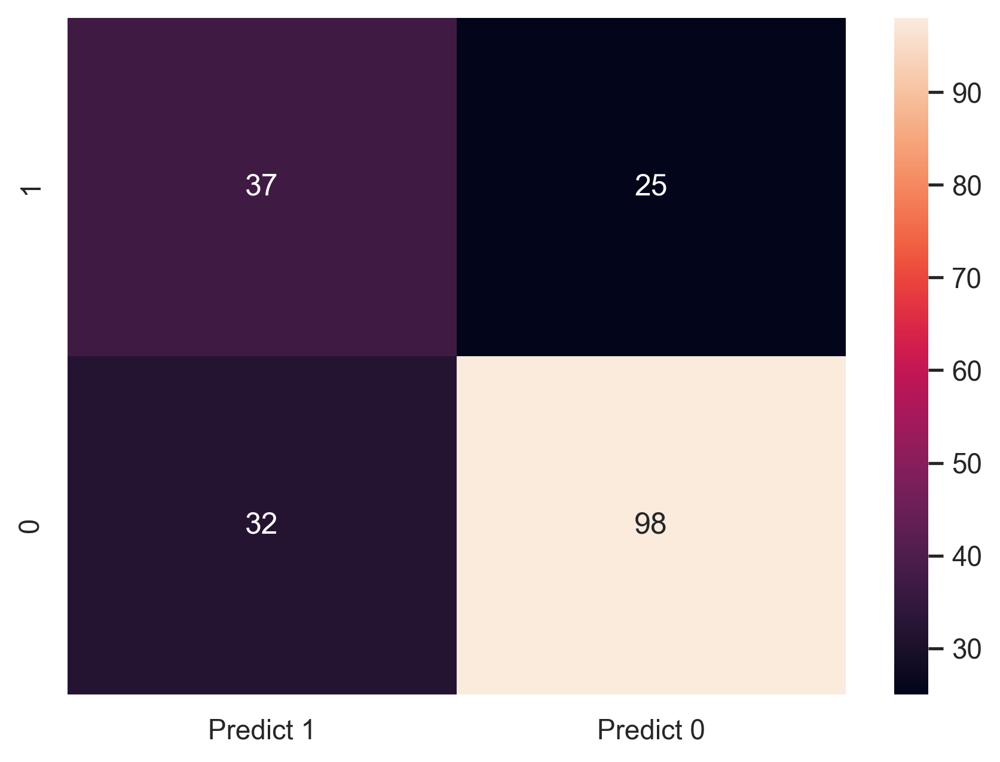

In [144]:
cm = metrics.confusion_matrix(y_test, y_pred_lr, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of Logistic regression

To decide which Model is best for our dataset, we check the AUC of all models. Model with good AUC score is the best model for our dataset.

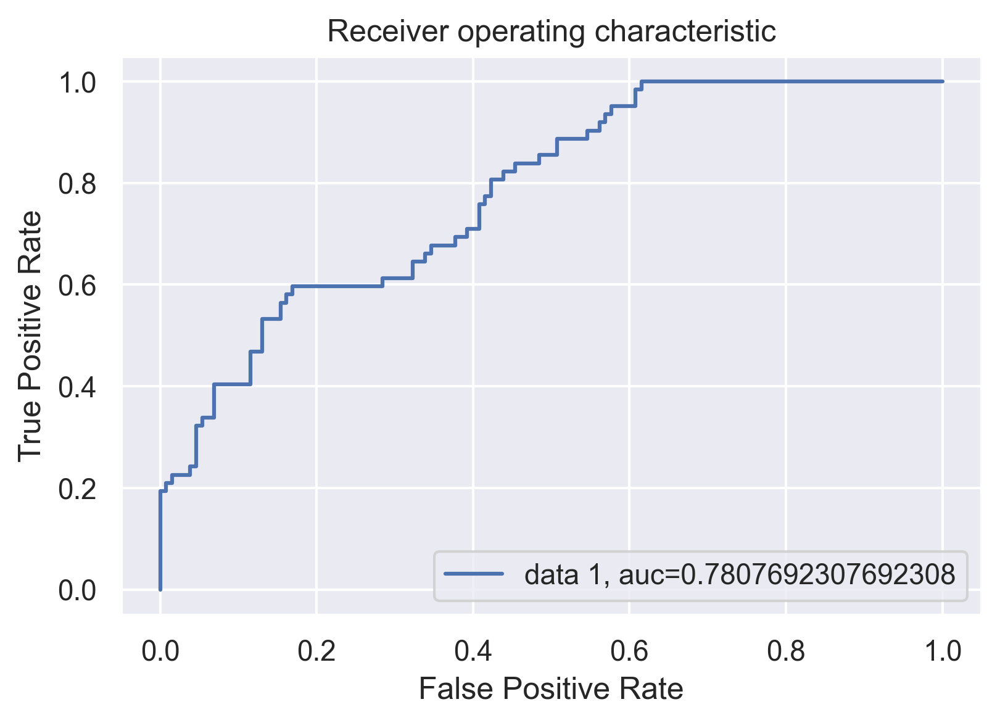

In [145]:
y_pred_proba = lr.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [146]:
lr_auc = auc
lr_auc

0.7807692307692308

## Decision Tree Classifier

In [147]:
def dtree_grid_search(X, y):
    #create a dictionary of all values we want to test
    param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(2, 15)}
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    # decision tree model
    dtree = DecisionTreeClassifier()
    
    #use gridsearch to test all values
    dtree_gscv = GridSearchCV(dtree, param_grid, cv=cv, n_jobs=-1, scoring='accuracy')
    #fit model to data
    dtree_gscv.fit(X, y)
    
    return dtree_gscv.best_params_

In [151]:
dtree_grid_search(X_train, y_train)

{'criterion': 'gini', 'max_depth': 13}

In [154]:
dTree = DecisionTreeClassifier(criterion = 'gini', max_depth = 13)
dTree.fit(X_train, y_train)

print(dTree.score(X_train,y_train))
print(dTree.score(X_test,y_test))

1.0
0.7291666666666666


In [155]:
y_pred_dtree = dTree.predict(X_test)

print(metrics.classification_report(y_test, y_pred_dtree))

              precision    recall  f1-score   support

           0       0.80      0.79      0.80       130
           1       0.58      0.60      0.59        62

    accuracy                           0.73       192
   macro avg       0.69      0.69      0.69       192
weighted avg       0.73      0.73      0.73       192



In [156]:
dt_tacc = dTree.score(X_test,y_test)

In [157]:
dt_train_acc = dTree.score(X_train, y_train)
dt_train_acc

1.0

### Confusion matrix of DecisionTree model

<AxesSubplot:>

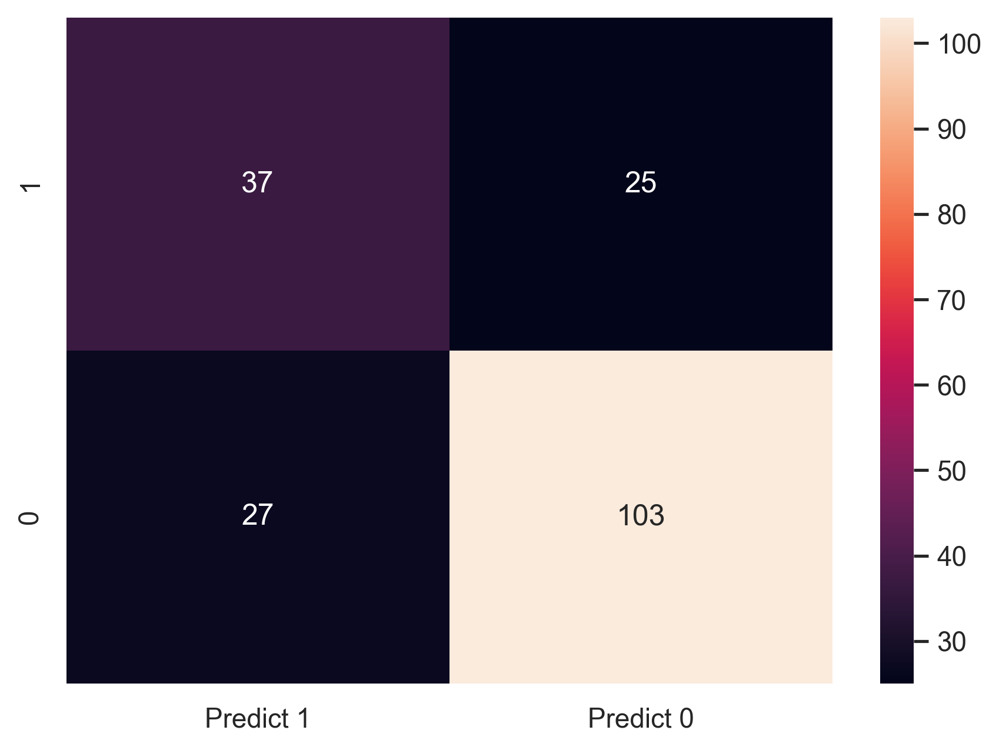

In [158]:
cm = metrics.confusion_matrix(y_test, y_pred_dtree, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of Decision Tree classifier model

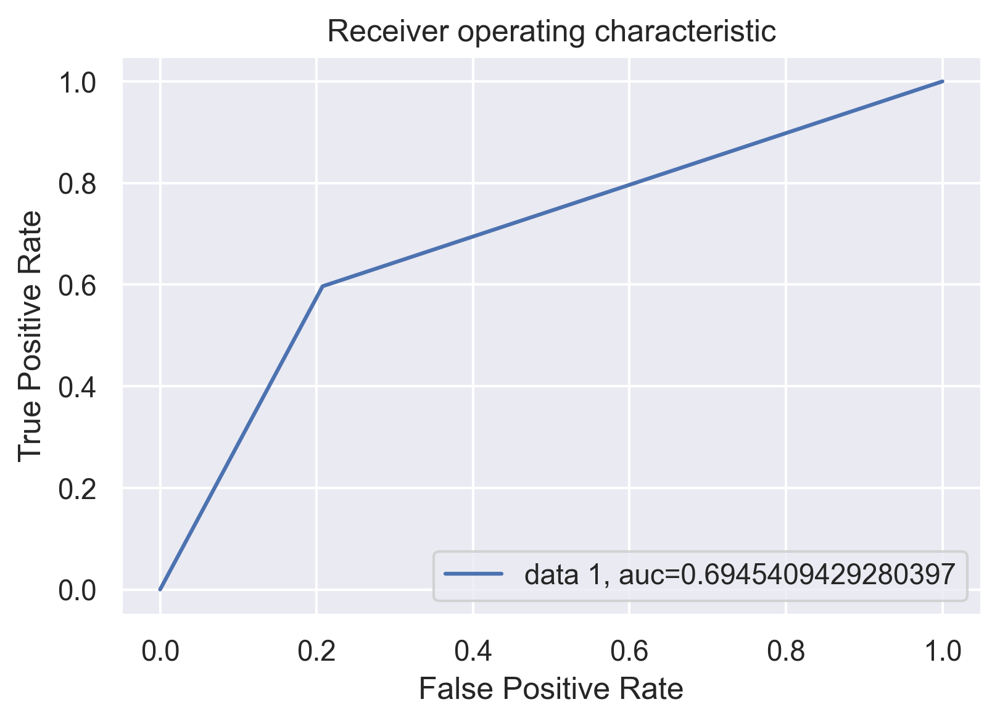

In [159]:
y_pred_proba = dTree.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [160]:
dt_auc = auc
dt_auc

0.6945409429280397

## Ensemble learning - AdaBoosting

In [161]:
def ada_grid_search(X, y):
    #create a dictionary of all values we want to test
    param_grid = {'n_estimators':[10, 50, 100, 500], 'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1.0]}
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    # AdaBoost model
    ada = AdaBoostClassifier()
    
    # Use gridsearch to test all values
    ada_gscv = GridSearchCV(ada, param_grid, n_jobs=-1, cv=cv, scoring='accuracy')
    #fit model to data
    grid_result = ada_gscv.fit(X, y)
    
    return ada_gscv.best_params_

In [162]:
ada_grid_search(X_train, y_train)

{'learning_rate': 1.0, 'n_estimators': 500}

In [163]:
abcl = AdaBoostClassifier(n_estimators=500, learning_rate = 1.0)
abcl = abcl.fit(X_train, y_train)

In [164]:
y_pred_abcl = abcl.predict(X_test)

print(abcl.score(X_train, y_train))
print(abcl.score(X_test,y_test))

0.9919354838709677
0.7135416666666666


In [165]:
print(metrics.classification_report(y_test, y_pred_abcl))

              precision    recall  f1-score   support

           0       0.77      0.82      0.80       130
           1       0.57      0.48      0.52        62

    accuracy                           0.71       192
   macro avg       0.67      0.65      0.66       192
weighted avg       0.70      0.71      0.71       192



In [166]:
ada_tacc = abcl.score(X_test,y_test)

In [167]:
ada_train_acc = abcl.score(X_train, y_train)

### Confusion matrix of AdaBoost Model

<AxesSubplot:>

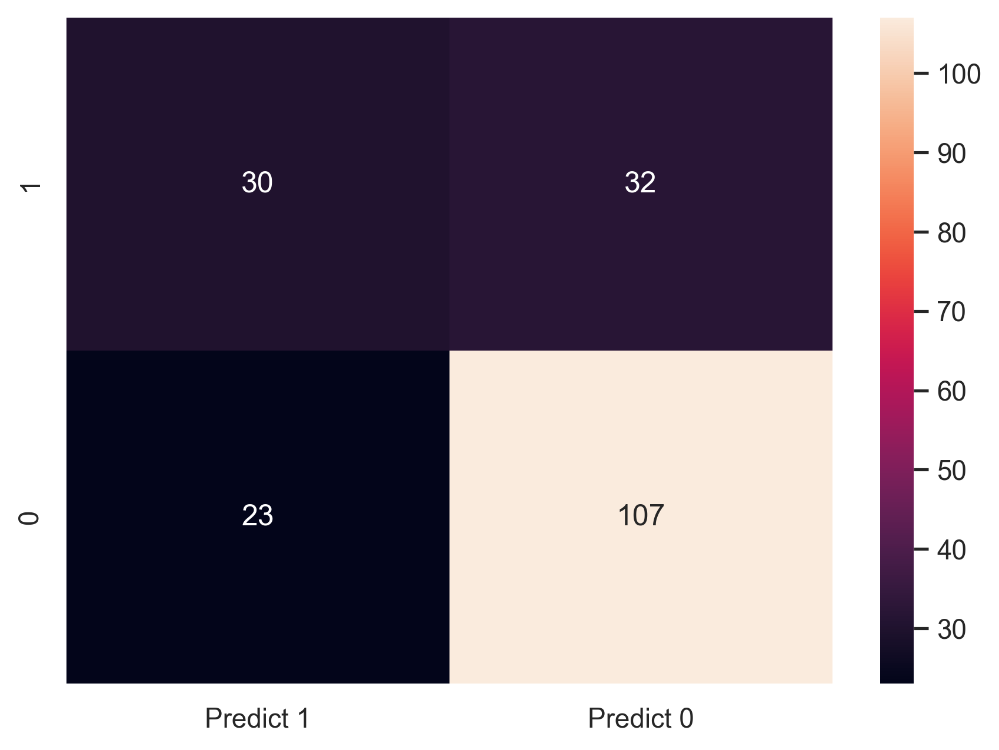

In [168]:
cm = metrics.confusion_matrix(y_test, y_pred_abcl, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of AdaBoost model

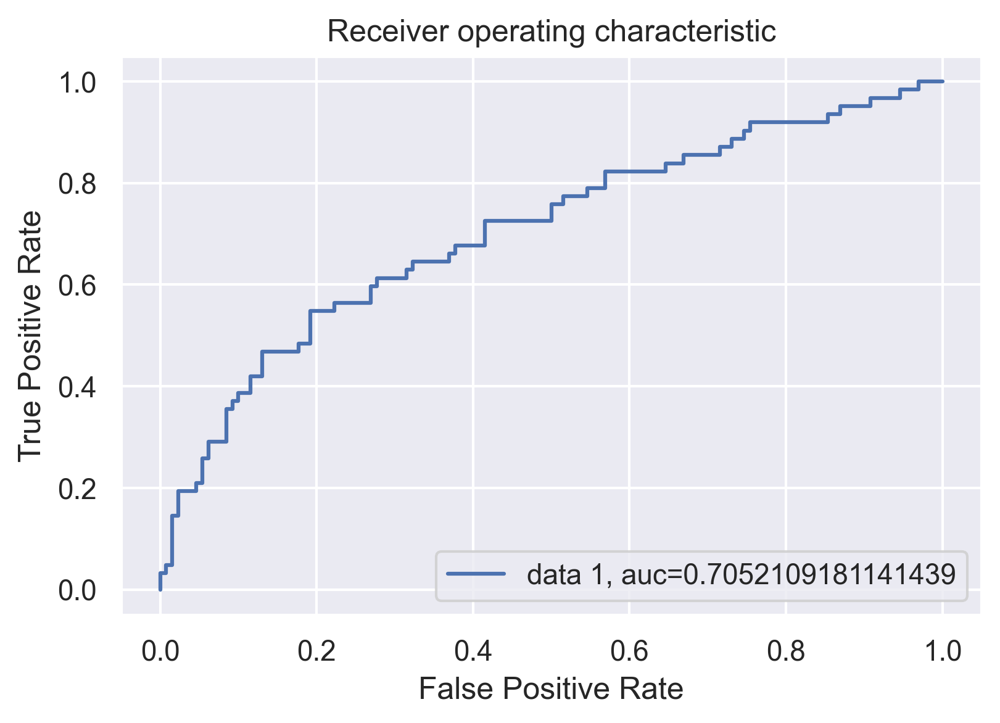

In [169]:
y_pred_proba = abcl.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [170]:
ada_auc = auc
ada_auc

0.7052109181141439

## Ensemble RandomForest Classifier

In [171]:
def rf_grid_search(X, y):
    #create a dictionary of all values we want to test
    param_grid = { 
    'n_estimators': [5,10,20,40,50,60,70,80,100],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
    }
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    # Random Forest model
    rf = RandomForestClassifier()
    
    #use gridsearch to test all values
    rf_gscv = GridSearchCV(rf, param_grid, cv=cv, n_jobs=-1, scoring='accuracy')
    #fit model to data
    rf_gscv.fit(X, y)
    
    return rf_gscv.best_params_

In [172]:
rf_grid_search(X_train, y_train)

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'auto',
 'n_estimators': 100}

In [174]:
rfcl = RandomForestClassifier(n_estimators=100, max_features='auto', max_depth=8, criterion='entropy')
rfcl = rfcl.fit(X_train, y_train)

y_pred_rf = rfcl.predict(X_test)

print(rfcl.score(X_train,y_train))
print(rfcl.score(X_test,y_test))

0.9741935483870968
0.734375


In [175]:
print(metrics.classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.82      0.78      0.80       130
           1       0.58      0.63      0.60        62

    accuracy                           0.73       192
   macro avg       0.70      0.71      0.70       192
weighted avg       0.74      0.73      0.74       192



In [176]:
rf_tacc = rfcl.score(X_test,y_test)

In [177]:
rf_train_acc = rfcl.score(X_train, y_train)

### Confusion matrix of Random Forest model

<AxesSubplot:>

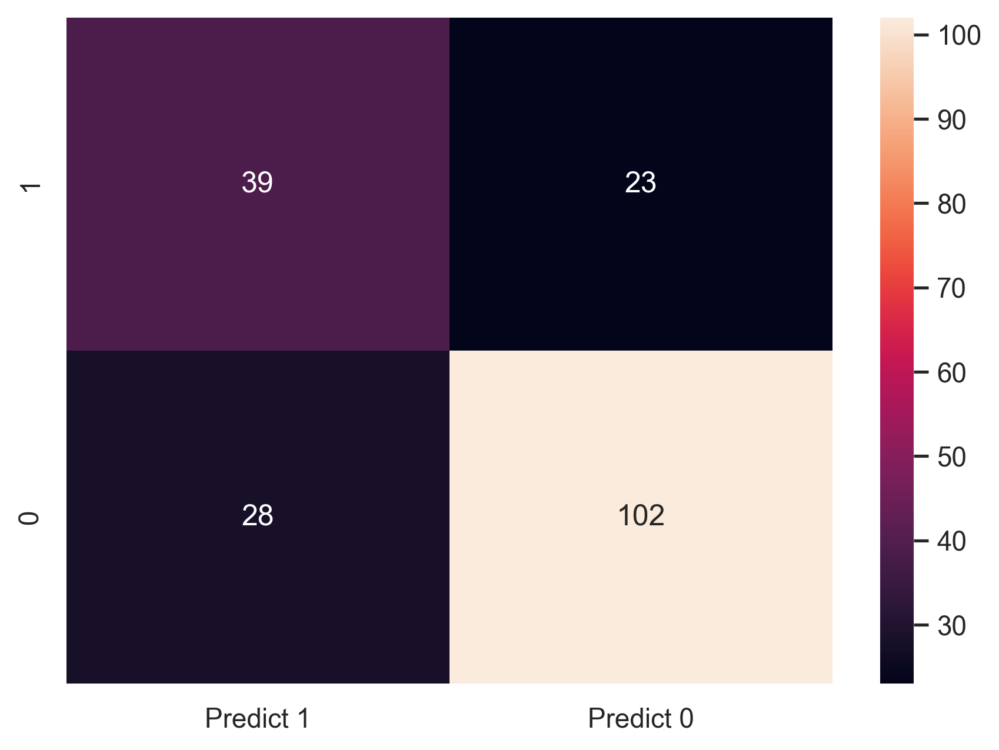

In [178]:
cm = metrics.confusion_matrix(y_test, y_pred_rf, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of Random Forest Classifier

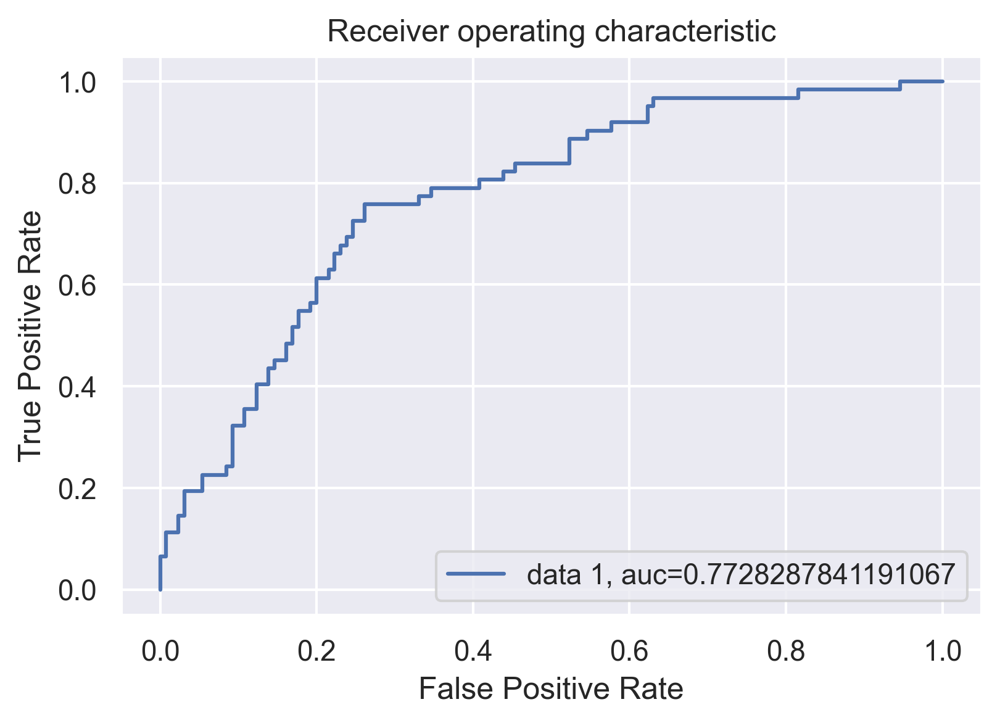

In [179]:
y_pred_proba = rfcl.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [180]:
rf_auc = auc
rf_auc

0.7728287841191067

## kNN

In [252]:
def knn_grid_search(X, y):
    #create a dictionary of all values we want to test
    k_range = list(range(1, 31))
    param_grid = dict(n_neighbors=k_range)
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    knn = KNeighborsClassifier()
    
    #use gridsearch to test all values
    knn_gscv = GridSearchCV(knn, param_grid, cv=cv, scoring='accuracy', n_jobs=-1)
    #fit model to data
    knn_gscv.fit(X, y)
    
    return knn_gscv.best_params_

In [253]:
knn_grid_search(X_train, y_train)

{'n_neighbors': 1}

In [217]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

print(knn.score(X_train, y_train))
knn.score(X_test, y_test)

1.0


0.6979166666666666

In [218]:
print(metrics.classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

           0       0.76      0.80      0.78       130
           1       0.54      0.48      0.51        62

    accuracy                           0.70       192
   macro avg       0.65      0.64      0.65       192
weighted avg       0.69      0.70      0.69       192



In [219]:
knn_tacc = knn.score(X_test, y_test)

In [220]:
knn_train_acc = knn.score(X_train, y_train)

## Confusion matrix of kNN model

<AxesSubplot:>

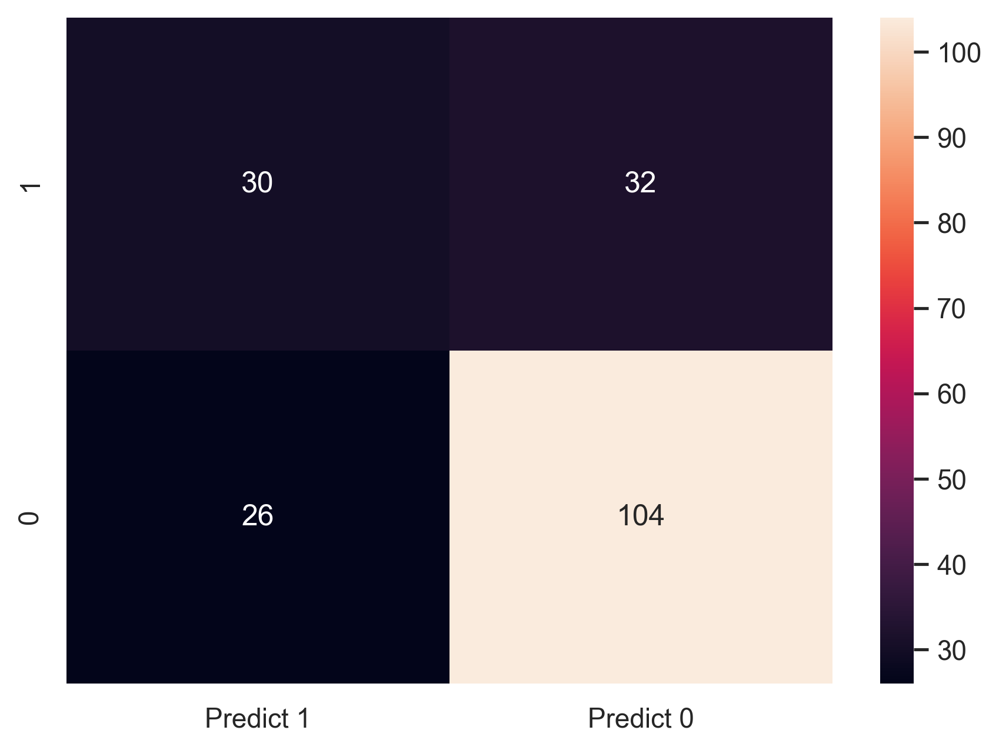

In [221]:
cm = metrics.confusion_matrix(y_test, y_pred_knn, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of KNN

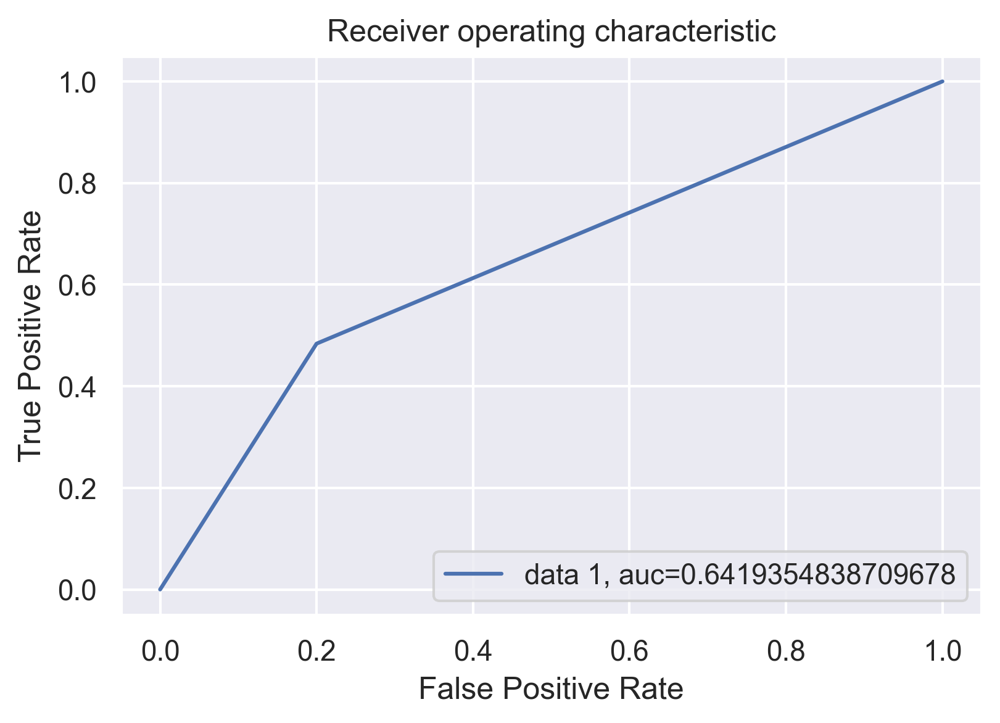

In [222]:
y_pred_proba = knn.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [223]:
knn_auc= auc
knn_auc

0.6419354838709678

## SVM

In [224]:
def svm_grid_search(X, y):
    #create a dictionary of all values we want to test
    param_grid = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001, 0.4, 0.2, 0.8],'kernel': ['rbf', 'poly', 'sigmoid']}
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    svm = SVC()
    
    #use gridsearch to test all values
    svm_gscv = RandomizedSearchCV(estimator = svm,
                           param_distributions = param_grid,
                           scoring = 'accuracy',
                           cv = cv,
                           n_jobs = -1)
    #fit model to data
    svm_gscv.fit(X, y)
    
    return svm_gscv.best_params_

In [225]:
svm_grid_search(X_train, y_train)

{'kernel': 'rbf', 'gamma': 0.8, 'C': 10}

In [226]:
from sklearn import svm
svm = SVC(gamma=0.8, C=10, kernel='rbf', probability=True)

svm.fit(X_train, y_train)

y_pred_svm = svm.predict(X_test)

print(svm.score(X_train, y_train))
svm.score(X_test, y_test)

1.0


0.6822916666666666

In [227]:
print(metrics.classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           0       0.72      0.86      0.79       130
           1       0.51      0.31      0.38        62

    accuracy                           0.68       192
   macro avg       0.62      0.58      0.58       192
weighted avg       0.66      0.68      0.66       192



In [228]:
svm_tacc = svm.score(X_test, y_test)

In [229]:
svm_train_acc = svm.score(X_train, y_train)

### Confusion Matrix of SVM

<AxesSubplot:>

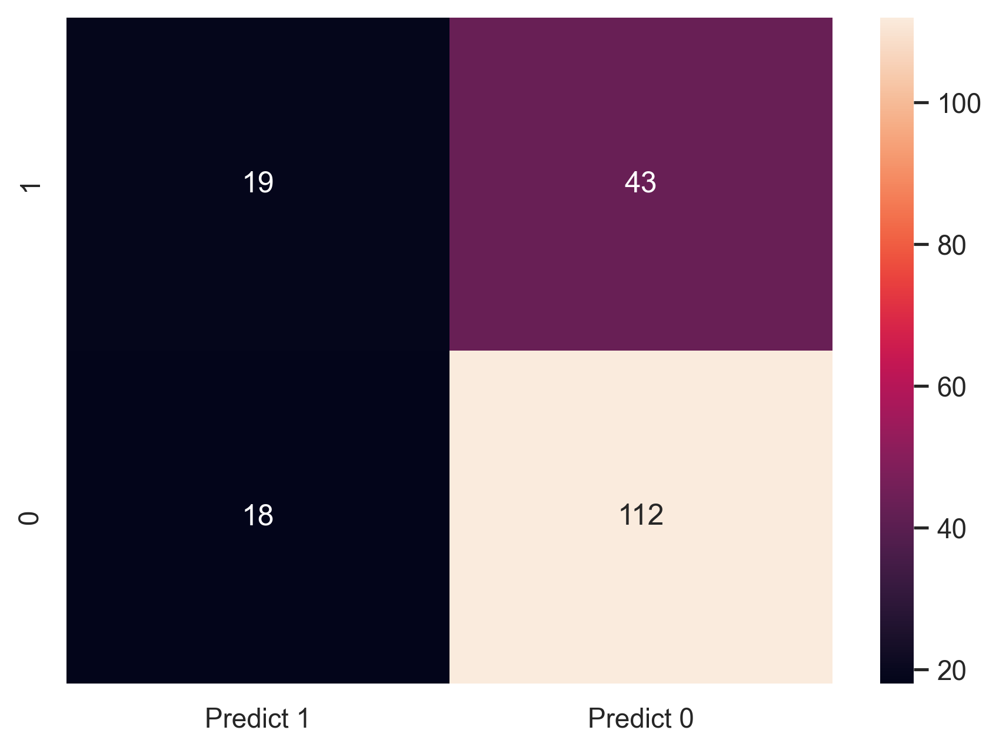

In [230]:
cm = metrics.confusion_matrix(y_test, y_pred_svm, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of SVM

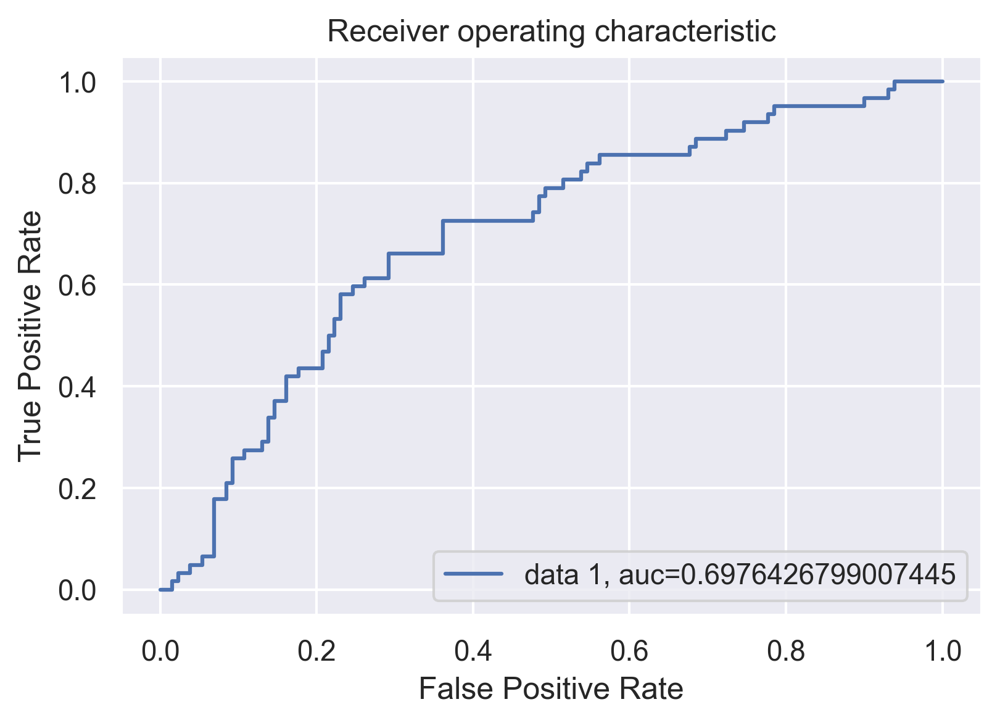

In [231]:
y_pred_proba = svm.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [232]:
svm_auc = auc
svm_auc

0.6976426799007445

## XGBoost Model

In [233]:
def xgb_grid_search(X, y):
    # Create a dictionary of all values we want to test
    param_grid = {
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
    
}
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    xgb = XGBClassifier()
    
    #use gridsearch to test all values
    xgb_gscv =  RandomizedSearchCV(estimator = xgb,
                           param_distributions = param_grid,
                           scoring = 'accuracy',
                           cv = cv,
                           n_jobs = -1)
    #fit model to data
    xgb_gscv.fit(X, y)
    
    return xgb_gscv.best_params_

In [234]:
xgb_grid_search(X_train, y_train)

[11:01:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


{'min_child_weight': 1,
 'max_depth': 5,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'colsample_bytree': 0.3}

In [235]:
xgb = XGBClassifier(min_child_weight=1, max_depth=5, learning_rate=0.2, gamma=0.1, colsample_bytree=0.3)
xgb.fit(X_train,y_train)

y_pred_xgb = xgb.predict(X_test)

print(classification_report(y_test, y_pred_xgb))

print("Accuracy:",metrics.accuracy_score(y_test, y_pred_xgb))
print("Precision:",metrics.precision_score(y_test, y_pred_xgb))
print("Recall:",metrics.recall_score(y_test, y_pred_xgb))

print(xgb.score(X_train,y_train))
print(xgb.score(X_test,y_test))

[11:01:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       130
           1       0.54      0.55      0.54        62

    accuracy                           0.70       192
   macro avg       0.66      0.66      0.66       192
weighted avg       0.70      0.70      0.70       192

Accuracy: 0.703125
Precision: 0.5396825396825397
Recall: 0.5483870967741935
1.0
0.703125


In [236]:
xgb_tacc = xgb.score(X_test,y_test)

In [237]:
xgb_train_acc = xgb.score(X_train, y_train)

### Confusion Matrix of XGBoost model

<AxesSubplot:>

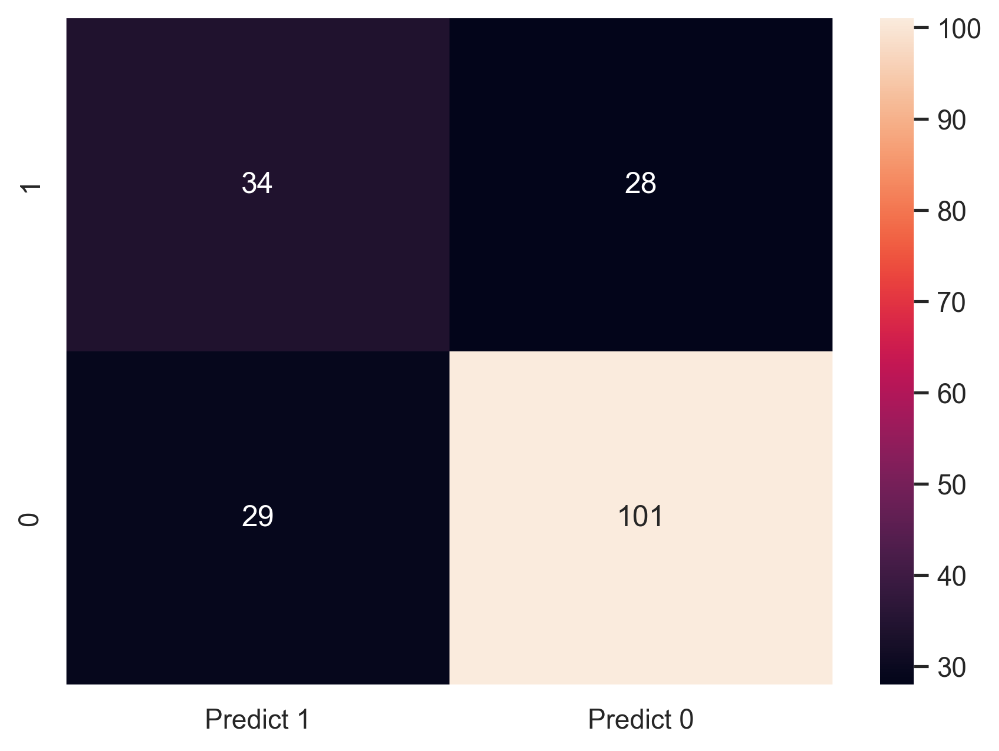

In [238]:
cm = metrics.confusion_matrix(y_test, y_pred_xgb, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of XGBoost model

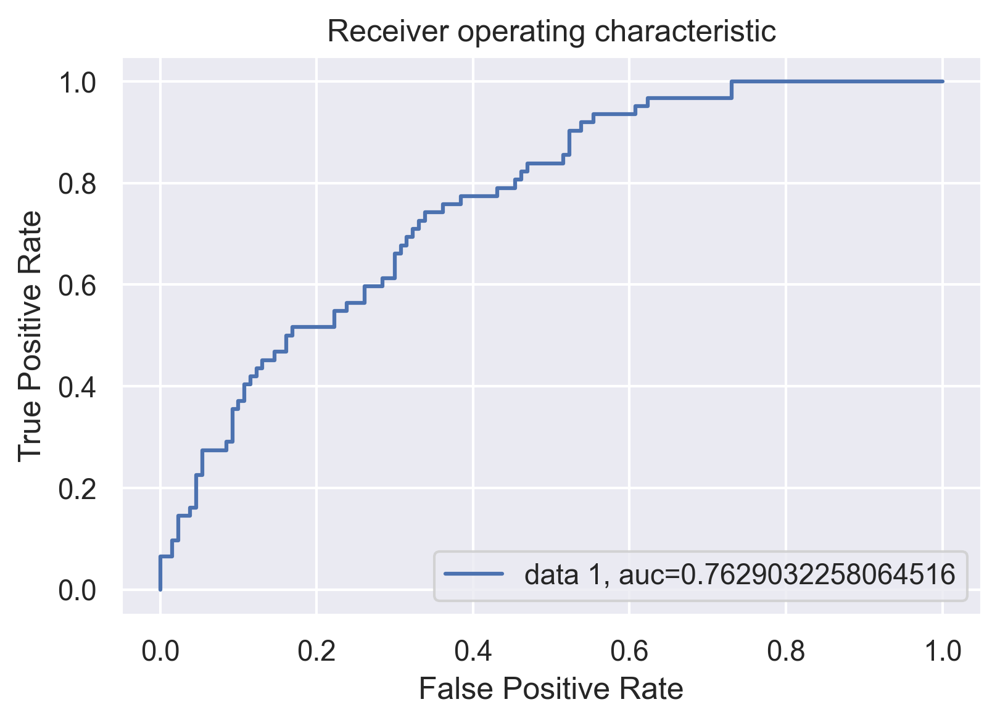

In [239]:
y_pred_proba = xgb.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [240]:
xgb_auc = auc

# Comparision of all Models

In [241]:
def comp_model(model_list, model_train_acc_list, model_test_acc_list, model_auc_list):
    data = {"Model Name": model_list, "Train Accuracy(%)": [i*100 for i in model_train_acc_list], "Test Accuracy(%)": [i*100 for i in model_test_acc_list], "AUC Score": model_auc_list}
    Comparision = pd.DataFrame(data)
    return Comparision

In [242]:
model_list = ["Logistic Regression", "Decision Tree Classifier", "AdaBoost", "Random Forest Classifier", "kNN", "SVM", "XGBoost"]
model_train_acc_list = [lr_train_acc, dt_train_acc, ada_train_acc, rf_train_acc, knn_train_acc, svm_train_acc, xgb_train_acc]
model_test_acc_list = [lr_tacc, dt_tacc, ada_tacc, rf_tacc, knn_tacc, svm_tacc, xgb_tacc]
model_auc_list = [lr_auc, dt_auc, ada_auc, rf_auc, knn_auc, svm_auc, xgb_auc]
comp_model(model_list, model_train_acc_list, model_test_acc_list, model_auc_list)

,Model Name,Train Accuracy(%),Test Accuracy(%),AUC Score
0,Logistic Regression,80.806452,70.312500,0.780769
1,Decision Tree Classifier,100.000000,72.916667,0.694541
2,AdaBoost,99.193548,71.354167,0.705211
3,Random Forest Classifier,97.419355,73.437500,0.772829
4,kNN,100.000000,69.791667,0.641935
5,SVM,100.000000,68.229167,0.697643
6,XGBoost,100.000000,70.312500,0.762903


**Observations:**
- Other than Logistic Regression, kNN, and SVM Model are overfitting as they have Low Bias and High Variance (Low Train accuracy and High Test accuracy)
- Hence we have to do cross validation to find out best one among Logistic, kNN, and SVM Model

# Cross Validation

## Logistic Regression

In [244]:
from sklearn.model_selection import StratifiedKFold

skfold = StratifiedKFold(n_splits=5)
model = LogisticRegression(C=100, penalty='l2', solver='newton-cg')
scores = cross_val_score(model, features, y, cv=skfold)

print(scores)
print(np.mean(scores))

[0.7578125  0.765625   0.77165354 0.78740157 0.81102362]
0.778703248031496


# Multilayer Neural Network

In [254]:
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch
from keras.layers import Dense, Activation, LeakyReLU, Dropout
from keras.activations import relu, sigmoid

from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import roc_curve

# Hyperparameter Tuning

## Method 1 - Random Search

**Hyperparameters**
- How many number of hidden layers we should have?
- How many number of neurons we should have in hidden layers?
- Learning Rate

In [255]:
X_train.shape

(620, 8)

In [256]:
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Dense(units=hp.Int('units_inp', min_value=32, max_value=512, step=32),
                               activation=hp.Choice( 'activation', ['tanh', 'relu', 'LeakyReLU', 'elu']),
                               input_dim = 8
                          )
              )
    
    for i in range(hp.Int('num_layers', 2, 20)):                 # Number of layers
        model.add(layers.Dense(units=hp.Int('units_' + str(i),
                                            min_value=32,
                                            max_value=512,       # Number of neuron, here it is 32-512
                                            step=32),
                               activation=hp.Choice( 'activation', ['tanh', 'relu', 'LeakyReLU', 'elu'])))
                               
        if hp.Boolean("dropout"):
            model.add(layers.Dropout(rate=0.25))
        
    model.add(layers.Dense(1, activation='sigmoid'))
    
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='binary_crossentropy',
        metrics=['accuracy'])
    
    return model

In [257]:
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=3,
    directory='project',
    project_name='Diabetes Detection')

In [258]:
tuner.search_space_summary()

Search space summary
Default search space size: 7
units_inp (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
activation (Choice)
{'default': 'tanh', 'conditions': [], 'values': ['tanh', 'relu', 'LeakyReLU', 'elu'], 'ordered': False}
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 20, 'step': 1, 'sampling': None}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
dropout (Boolean)
{'default': False, 'conditions': []}
units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [259]:
tuner.search(X_train, y_train, epochs=5, validation_split=0.2)

Trial 5 Complete [00h 00m 04s]
val_accuracy: 0.8118279576301575

Best val_accuracy So Far: 0.8709677457809448
Total elapsed time: 00h 00m 22s
INFO:tensorflow:Oracle triggered exit


In [260]:
tuner.results_summary()

Results summary
Results in project\Diabetes Detection
Showing 10 best trials
Trial summary
Hyperparameters:
units_inp: 32
activation: LeakyReLU
num_layers: 9
units_0: 192
dropout: False
units_1: 224
learning_rate: 0.01
units_2: 96
units_3: 160
units_4: 320
units_5: 160
units_6: 512
units_7: 320
units_8: 128
units_9: 192
units_10: 512
units_11: 224
units_12: 288
units_13: 128
units_14: 224
units_15: 96
units_16: 128
Score: 0.8709677457809448
Trial summary
Hyperparameters:
units_inp: 192
activation: relu
num_layers: 8
units_0: 288
dropout: False
units_1: 224
learning_rate: 0.001
units_2: 128
units_3: 64
units_4: 64
units_5: 192
units_6: 160
units_7: 192
units_8: 480
units_9: 384
units_10: 384
units_11: 64
units_12: 480
units_13: 160
units_14: 384
units_15: 320
units_16: 128
Score: 0.8118279576301575
Trial summary
Hyperparameters:
units_inp: 224
activation: tanh
num_layers: 4
units_0: 480
dropout: True
units_1: 192
learning_rate: 0.001
units_2: 32
units_3: 32
Score: 0.7096774180730184
Tri

In [261]:
best_model = tuner.get_best_models(num_models=1)[0]

In [262]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                288       
_________________________________________________________________
dense_1 (Dense)              (None, 192)               6336      
_________________________________________________________________
dense_2 (Dense)              (None, 224)               43232     
_________________________________________________________________
dense_3 (Dense)              (None, 96)                21600     
_________________________________________________________________
dense_4 (Dense)              (None, 160)               15520     
_________________________________________________________________
dense_5 (Dense)              (None, 320)               51520     
_________________________________________________________________
dense_6 (Dense)              (None, 160)               5

In [263]:
best_model.fit(X_train,y_train,epochs=20)

Epoch 1/20
20/20 [==============================] - 1s 4ms/step - loss: 0.7707 - accuracy: 0.6339
Epoch 2/20
20/20 [==============================] - 0s 4ms/step - loss: 0.5697 - accuracy: 0.7000
Epoch 3/20
20/20 [==============================] - 0s 4ms/step - loss: 0.5168 - accuracy: 0.7806
Epoch 4/20
20/20 [==============================] - 0s 5ms/step - loss: 0.4232 - accuracy: 0.8129
Epoch 5/20
20/20 [==============================] - 0s 5ms/step - loss: 0.3941 - accuracy: 0.8113
Epoch 6/20
20/20 [==============================] - 0s 4ms/step - loss: 0.3845 - accuracy: 0.8323
Epoch 7/20
20/20 [==============================] - 0s 5ms/step - loss: 0.3619 - accuracy: 0.8419
Epoch 8/20
20/20 [==============================] - 0s 5ms/step - loss: 0.3691 - accuracy: 0.8194
Epoch 9/20
20/20 [==============================] - 0s 5ms/step - loss: 0.3646 - accuracy: 0.8435
Epoch 10/20
20/20 [==============================] - 0s 4ms/step - loss: 0.3479 - accuracy: 0.8323
Epoch 11/20
20/20 [

In [264]:
# Train and Test accuracy
scores = best_model.evaluate(X_train,y_train)
print("Training Accuracy: %.2f%%\n" % (scores[1]*100))
scores = best_model.evaluate(X_test,y_test)
print("Testing Accuracy: %.2f%%\n" % (scores[1]*100))

20/20 [==============================] - 0s 2ms/step - loss: 0.3098 - accuracy: 0.8968
Training Accuracy: 89.68%

6/6 [==============================] - 0s 2ms/step - loss: 0.6312 - accuracy: 0.7448
Testing Accuracy: 74.48%



Text(0, 0.5, 'True Positive Rate')

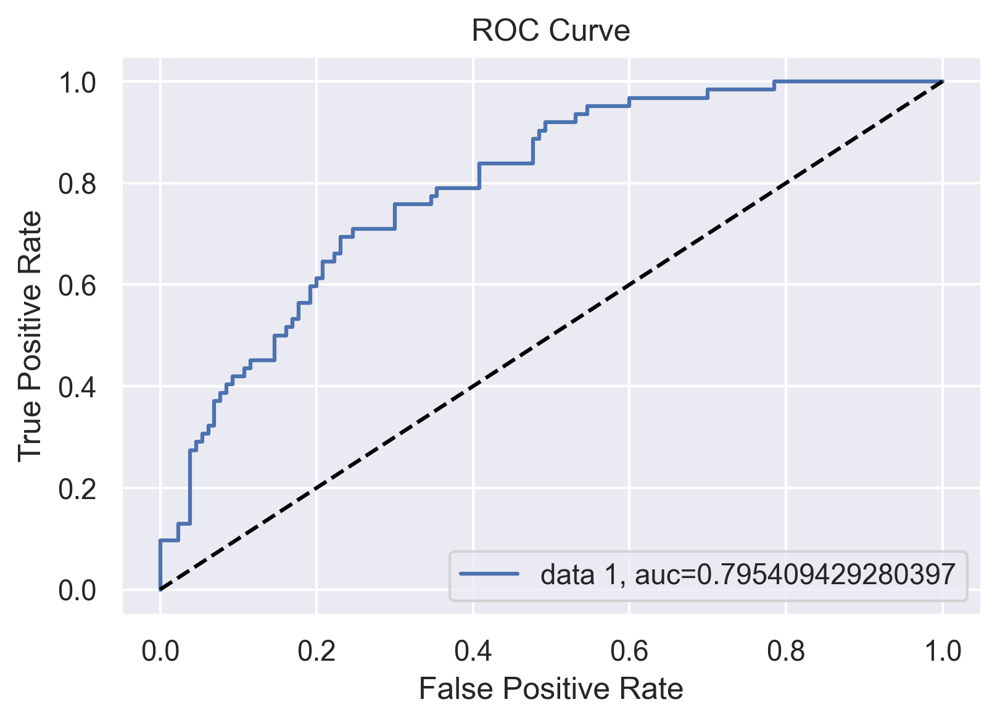

In [265]:
y_test_pred_probs = best_model.predict(X_test)
FPR, TPR, _ = roc_curve(y_test,y_test_pred_probs)

auc = metrics.roc_auc_score(y_test, y_test_pred_probs)
auc

plt.plot(FPR,TPR,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0,1],[0,1],'--',color='black')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

## Method 2 - GridSearchCV

In [266]:
X_train.shape

(620, 8)

In [269]:
def create_model(layers, activation):
    model = Sequential()
    for i, nodes in enumerate(layers):
        if i==0:
            model.add(Dense(nodes, input_dim=X_train.shape[1]))
            model.add(Activation(activation))
            model.add(Dropout(0.3))
        else:
            model.add(Dense(nodes))
            model.add(Activation(activation))
            model.add(Dropout(0.3))
            
    model.add(Dense(units = 1, activation = 'sigmoid'))
    
    model.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])
    return model
    
model = KerasClassifier(build_fn=create_model, verbose=0)

In [270]:
layers = [[20], [40, 20], [45, 30, 15], [96, 288, 96, 256, 384, 128, 32, 32, 32, 32, 32, 32, 32, 32, 32]]
activations = ['LeakyReLU', 'relu']
param_grid = dict(layers=layers, activation=activations, batch_size = [128, 256], epochs=[20, 30, 50, 100])

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)
grid_result = grid.fit(X_train, y_train)

print(grid_result.best_params_)

{'activation': 'relu', 'batch_size': 128, 'epochs': 100, 'layers': [96, 288, 96, 256, 384, 128, 32, 32, 32, 32, 32, 32, 32, 32, 32]}


In [271]:
model = Sequential()


model.add(Dense(416, input_dim=8, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(96,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(288,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(96,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(256,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(384,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32,activation='relu'))
model.add(Dropout(0.3))


model.add(Dense(units = 1, activation = 'sigmoid'))

model.summary()

Model: "sequential_332"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2052 (Dense)           (None, 416)               3744      
_________________________________________________________________
dropout_1710 (Dropout)       (None, 416)               0         
_________________________________________________________________
dense_2053 (Dense)           (None, 96)                40032     
_________________________________________________________________
dropout_1711 (Dropout)       (None, 96)                0         
_________________________________________________________________
dense_2054 (Dense)           (None, 288)               27936     
_________________________________________________________________
dropout_1712 (Dropout)       (None, 288)               0         
_________________________________________________________________
dense_2055 (Dense)           (None, 96)             

In [272]:
model.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])

In [273]:
model.fit(X_train, y_train, epochs=100, batch_size=128)

Epoch 1/100
5/5 [==============================] - 1s 9ms/step - loss: 0.6936 - accuracy: 0.4742
Epoch 2/100
5/5 [==============================] - 0s 9ms/step - loss: 0.6933 - accuracy: 0.4887
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.6928 - accuracy: 0.5323
Epoch 4/100
5/5 [==============================] - 0s 10ms/step - loss: 0.6934 - accuracy: 0.5113
Epoch 5/100
5/5 [==============================] - 0s 9ms/step - loss: 0.6937 - accuracy: 0.5129
Epoch 6/100
5/5 [==============================] - 0s 9ms/step - loss: 0.6927 - accuracy: 0.5581
Epoch 7/100
5/5 [==============================] - 0s 10ms/step - loss: 0.6914 - accuracy: 0.5194
Epoch 8/100
5/5 [==============================] - 0s 9ms/step - loss: 0.6847 - accuracy: 0.6048
Epoch 9/100
5/5 [==============================] - 0s 10ms/step - loss: 0.6709 - accuracy: 0.5581
Epoch 10/100
5/5 [==============================] - 0s 10ms/step - loss: 0.6190 - accuracy: 0.6242
Epoch 11/100
5/5 [=======

5/5 [==============================] - 0s 8ms/step - loss: 0.2488 - accuracy: 0.9242
Epoch 85/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2398 - accuracy: 0.9242
Epoch 86/100
5/5 [==============================] - 0s 8ms/step - loss: 0.2042 - accuracy: 0.9387
Epoch 87/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2308 - accuracy: 0.9242
Epoch 88/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2083 - accuracy: 0.9210
Epoch 89/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2020 - accuracy: 0.9387
Epoch 90/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2279 - accuracy: 0.9258
Epoch 91/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1991 - accuracy: 0.9274
Epoch 92/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2194 - accuracy: 0.9161
Epoch 93/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2239 - accuracy: 0.9306
Epoch 94/100
5/5 [===========

In [274]:
# Train and Test accuracy
scores = model.evaluate(X_train,y_train)
print("Training Accuracy: %.2f%%\n" % (scores[1]*100))
scores = model.evaluate(X_test,y_test)
print("Testing Accuracy: %.2f%%\n" % (scores[1]*100))

20/20 [==============================] - 0s 2ms/step - loss: 0.1793 - accuracy: 0.9355
Training Accuracy: 93.55%

6/6 [==============================] - 0s 4ms/step - loss: 0.9389 - accuracy: 0.7240
Testing Accuracy: 72.40%



Text(0, 0.5, 'True Positive Rate')

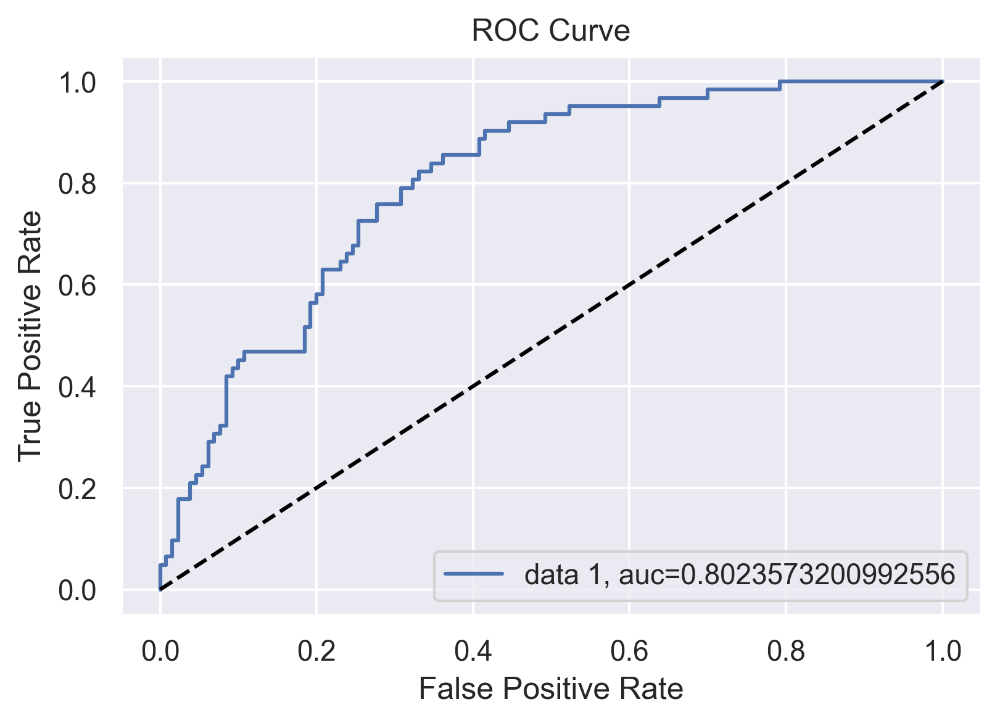

In [275]:
from sklearn.metrics import roc_curve
y_test_pred_probs = model.predict(X_test)
FPR, TPR, _ = roc_curve(y_test,y_test_pred_probs)

auc = metrics.roc_auc_score(y_test, y_test_pred_probs)
auc

plt.plot(FPR,TPR,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0,1],[0,1],'--',color='black')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

**Conclusion:**
- Using Dense Neural Network, we are getting around 89% training accuracy and 74% test accuracy which seems to be the case of overfitting.
- Hence Logistic Regression is best for this project

# Prediction System - Logistic Regression

In [117]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [116]:
#input data and transform into numpy array
in_data= np.asarray(tuple(map(float,input().rstrip().split(','))))

#reshape and scale the input array
in_data_re = in_data.reshape(1,-1)
in_data_sca = scaler.transform(in_data_re)

#print the predicted output for input array
print("This person has Diabetes" if lr.predict(in_data_sca) else "This person don't have Diabetes")

0,137,40,35,168,43.1,2.288,33
This person has Diabetes
